# Análise dos dados de  scRNA-seq:  
# MANUAL ANNOTATION

> **CONDA ENV:** scrnaseq_workflow e scRNA_NEW

> **Recommendation:**   
> visualize better by collapsing the `Function and Packages` session. The `Annotation section` contains the execution codes and results

# 05. Annotation — Overview



This notebook focuses on the **biological annotation of intestinal epithelial cell populations** after quality control, integration, and clustering of the scRNA-seq data.

The annotation workflow is structured in **progressive and interpretable steps**, moving from data-driven signals to biologically curated labels:

- Start from the **QC-filtered and integrated AnnData (`.h5ad`)** dereived from `04.Integration-clustering.ipynb´.

- Use curated marker gene sets from:
  - Internal marker collections
  - Published datasets (e.g. Nirello et al.)
- Evaluate clusters using multiple complementary strategies:
  - **Dotplots** of canonical markers
  - **Module scores** (relative expression compared to other cells)
  - **AUCell scores** (absolute activation of gene signatures)
- Cross-check cluster DEGs against literature markers using:
  - Percentage overlap
  - Fisher’s exact test for enrichment

### Manual epithelial cell-type assignment
- Assign **fine-grained epithelial identities** (e.g. Enterocyte, Goblet, Stem, Tuft, Enteroendocrine) to each Leiden cluster.
- Store annotations directly in `adata.obs` for downstream analyses.
- Validate annotations visually using:
  - UMAPs (clusters vs. cell types)
  - Marker dotplots grouped by annotated cell type

### Functional aggregation (ASP level)
- Collapse fine-grained epithelial identities into **broader functional classes**:
  - **Absorptive**
  - **Secretory**
  - **Progenitor**
- This abstraction facilitates higher-level comparisons and biological interpretation while preserving traceability to original clusters.

### Iterative refinement
- Annotation is treated as an **iterative process**:
  - If unwanted clusters (e.g. immune contaminants or low-quality populations) are detected, they can be excluded.
  - The integration and annotation steps can be rerun as needed.


# FUNCTIONS AND PACKAGES

In [ ]:
import warnings
warnings.filterwarnings("ignore")

from scipy.stats import fisher_exact
from numba.core.errors import NumbaDeprecationWarning
from pathlib import Path

import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import anndata as ad
import decoupler as dc



sc.set_figure_params(figsize=(10,10))


## 1th LAYER

### Markers

In [ ]:
def ImportMarkers(excel_dir: str, sheet_name: str, id_col: str, gene_col: str):
    # Read marker genes table from an Excel file
    marker_genes = pd.read_excel(excel_dir, sheet_name=sheet_name)

    # Group genes by cluster / cell-type identifier (id_col)
    # and store them as a dictionary: {cluster: [genes]}
    marker_genes = (
        marker_genes
        .groupby(id_col, sort=False)[gene_col]
        .apply(list)
        .to_dict()
    )

    # Clean and standardize cluster names and gene symbols
    cleaned = {}
    for cell, gene_list in marker_genes.items():
        # Ensure cluster/cell-type identifier is a clean string
        cell_str = str(cell).strip() if cell is not None else "NA"

        # Clean gene names:
        # - remove NaNs
        # - convert to string
        # - strip extra spaces
        # - capitalize for consistency with AnnData var names
        genes_clean = [
            str(gene).strip().capitalize()
            for gene in gene_list
            if pd.notna(gene)
        ]

        cleaned[cell_str] = genes_clean

    return cleaned


def MarkerInData(marker_genes, adata):
    # Check which marker genes are actually present in the dataset
    # Returns a dictionary: {cell_type: [markers_found_in_adata]}
    marker_genes_in_data = {}

    for ct, markers in marker_genes.items():
        markers_found = []
        for marker in markers:
            # Keep only markers that exist in adata.var.index (genes in the dataset)
            if marker in adata.var.index:
                markers_found.append(marker)

        marker_genes_in_data[ct] = markers_found

    return marker_genes_in_data


In [ ]:
def RankGenesByCluster(
    adata,
    groupby="leiden_res1",
    layer="QC_filtered_log1p",
    n_genes=10,
    filtra_mt_rb_hb=False
):
    # 1️⃣ Identify differentially expressed genes (DEGs) per cluster
    # Uses Wilcoxon test, which is well suited for scRNA-seq data
    sc.tl.rank_genes_groups(
        adata,
        groupby=groupby,
        layer=layer,
        method="wilcoxon"
    )

    # 2️⃣ Extract top genes per cluster
    cluster_genes = {}

    # Iterate over clusters returned by Scanpy
    for c, group in enumerate(adata.uns["rank_genes_groups"]["names"].dtype.names):
        all_genes = list(adata.uns["rank_genes_groups"]["names"][group])

        # Optional filtering of mitochondrial, ribosomal, and hemoglobin genes
        if filtra_mt_rb_hb:
            clean_genes = [
                gene for gene in all_genes
                if ("mt" not in gene.lower())
                and ("rp" not in gene.lower())
                and ("hb" not in gene.lower())
            ]
            genes = clean_genes[:n_genes]
        else:
            genes = all_genes[:n_genes]

        # Store top genes for each cluster
        cluster_genes[group] = genes

    # 3️⃣ Build a consolidated list of genes
    # Removes duplicates while preserving the original order
    top_genes = list(
        dict.fromkeys(
            [g for genes in cluster_genes.values() for g in genes]
        )
    )

    # 4️⃣ Compute mean expression per cluster
    # Uses the specified layer if available
    if layer in adata.layers:
        expr = pd.DataFrame(
            adata[:, top_genes].layers[layer].toarray(),
            index=adata.obs_names,
            columns=top_genes,
        )
    else:
        expr = adata[:, top_genes].to_df()

    # Add cluster labels and compute mean expression per cluster
    expr[groupby] = adata.obs[groupby].values
    mean_exp = expr.groupby(groupby).mean().T  # genes as rows, clusters as columns

    # 5️⃣ Z-score scaling per gene
    mean_vals = mean_exp.mean(axis=1).to_numpy()[:, np.newaxis]
    std_vals = mean_exp.std(axis=1).replace(0, np.nan).to_numpy()[:, np.newaxis]
    scaled = (mean_exp.to_numpy() - mean_vals) / std_vals
    scaled_df = pd.DataFrame(
        scaled,
        index=mean_exp.index,
        columns=mean_exp.columns
    )

    # 6️⃣ Return both:
    # - dictionary of top genes per cluster
    # - scaled expression matrix for visualization
    return cluster_genes, scaled_df


def PlotTopDEGsHeatmap(
    scaled_df,
    title="",
    cmap="magma",
    figsize=(10, 8)
):
    """
    Generate a heatmap of top differentially expressed genes per cluster.
    """

    # Create figure
    plt.figure(figsize=figsize)

    # Plot heatmap using scaled expression values
    ax = sns.heatmap(
        scaled_df,
        cmap=cmap,
        center=0,
        yticklabels=True,
        cbar=True,
        square=False,
        xticklabels=True,
        linewidths=0,        # avoid internal grid lines
        linecolor='white',  # ensure no visible cell borders
        rasterized=True,    # enforce continuous rendering (avoid pixel artifacts)
    )

    # Remove spines and background artifacts
    ax.set_facecolor('none')
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.grid(False)

    # Labels and layout
    plt.title(title, fontsize=13)
    plt.xlabel("Cluster")
    plt.ylabel("Genes")
    plt.tight_layout()
    plt.show()


### Scores

In [ ]:
def CalculateModuleScores(
    adata,
    marker_genes_dic,
    layer="QC_filtered_log1p",
    min_genes=5
):
    """
    Compute normalized module scores for each marker gene set.

    For each marker set:
    - Genes are matched case-insensitively to adata.var_names
    - A raw score is computed using Scanpy's score_genes
    - The score is normalized by sqrt(number of genes) to make
      scores comparable across signatures of different sizes

    If no valid genes are found for a marker set, the score is set to 0.
    """

    # Map gene names in adata to uppercase for case-insensitive matching
    var_map = {g.upper(): g for g in adata.var_names}

    for name, genes in marker_genes_dic.items():
        # Keep only genes present in the dataset
        genes_ok = [var_map[g.upper()] for g in genes if g.upper() in var_map]

        # Optional warning for small gene sets (kept commented by design)
        # if len(genes_ok) < min_genes:
        #     print(f"Warning: '{name}' has only {len(genes_ok)} valid genes — score may be unstable.")

        # If no valid genes, assign zero score and continue
        if not genes_ok:
            adata.obs[f"score_{name}"] = 0.0
            continue

        # Compute raw module score using the specified expression layer
        sc.tl.score_genes(
            adata,
            gene_list=genes_ok,
            score_name=f"score_{name}_raw",
            use_raw=False,
            layer=layer
        )

        # Normalize score by the square root of the number of genes
        n_genes = len(genes_ok)
        adata.obs[f"score_{name}"] = adata.obs[f"score_{name}_raw"] / np.sqrt(n_genes)

        # Drop the raw score column to keep adata.obs clean
        adata.obs.drop(columns=[f"score_{name}_raw"], inplace=True)

    return adata


def PlotModuleScoresUMAPs(
    adata,
    score_names=None,
    ncols=4,
    cmap="bwr",
    share_scale=False,
    percentile=99,
    figsize=(4, 4),
    show_colorbar=True
):
    """
    Plot UMAPs colored by module scores.

    Parameters:
    - score_names: list of score columns to plot. If None, all columns
      starting with 'score_' are used.
    - share_scale: if True, all plots share the same symmetric color scale
      centered at zero.
    - percentile: robust clipping of color scale using |score| percentiles.
    """

    print("===========================================================")
    print("MODULE SCORES (Relative signature compared to other cells)")
    print("===========================================================")

    # Automatically detect score columns if not provided
    if score_names is None:
        score_names = [c for c in adata.obs.columns if c.startswith("score_")]

    # Determine color scale limits
    if share_scale:
        # Use a global symmetric scale across all scores
        vals = np.concatenate([adata.obs[s].values for s in score_names])
        vmax = np.percentile(np.abs(vals), percentile)
        vmins = [-vmax] * len(score_names)
        vmaxs = [vmax] * len(score_names)
    else:
        # Use an individual symmetric scale per score
        vmaxs = [
            np.percentile(np.abs(adata.obs[s].values), percentile)
            for s in score_names
        ]
        vmins = [-v for v in vmaxs]

    # Layout configuration
    n = len(score_names)
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(figsize[0] * ncols, figsize[1] * nrows)
    )
    axes = np.atleast_1d(axes).ravel()

    # Plot each score on UMAP
    for i, s in enumerate(score_names):
        sc.pl.umap(
            adata,
            color=s,
            color_map=cmap,
            vmin=vmins[i],
            vmax=vmaxs[i],
            ax=axes[i],
            show=False,
            frameon=False,
            colorbar_loc=("right" if show_colorbar else "none"),
        )
        axes[i].set_title(s.replace("score_", ""), fontsize=11)

    # Turn off unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    return fig


In [ ]:
def CalculateAUCellWithDecoupler(
    adata,
    marker_genes_dic,
    layer="QC_filtered_log1p",
    n_up=None,
    tmin=1,
    min_genes=5,
    prefix="aucell_"
):
    """
    Compute AUCell scores using decoupler for predefined gene signatures.

    This function:
    - Builds a decoupler-compatible network from marker genes
    - Runs AUCell on the specified expression layer
    - Normalizes each AUCell score by sqrt(n_genes) to allow comparison
      across signatures of different sizes
    - Stores the final scores in adata.obs with a configurable prefix
    """

    import decoupler as dc

    def BuildDecouplerNet(adata, marker_genes_dic):
        """
        Build a decoupler network (source → target) matching marker genes
        to genes present in adata.var_names (case-insensitive).
        """
        var_map = {g.upper(): g for g in adata.var_names}
        rows = []
        for src, genes in marker_genes_dic.items():
            for g in genes:
                up = g.upper()
                if up in var_map:
                    rows.append((src, var_map[up]))
        net = pd.DataFrame(rows, columns=["source", "target"]).drop_duplicates()
        return net

    # Build marker network compatible with the current AnnData object
    net = BuildDecouplerNet(adata, marker_genes_dic)

    # Run AUCell via decoupler on the selected layer
    dc.mt.aucell(
        data=adata,
        net=net,
        tmin=tmin,
        layer=layer,
        raw=False,
        n_up=n_up,
        verbose=False
    )

    # Extract AUCell scores from adata.obsm
    sc_adata = dc.pp.get_obsm(adata, key="score_aucell")
    df = pd.DataFrame(
        sc_adata.X,
        index=adata.obs_names,
        columns=sc_adata.var_names
    )

    # Normalize scores and handle small or missing gene sets
    for name, genes in marker_genes_dic.items():
        valid_genes = [
            g for g in genes
            if g.upper() in (x.upper() for x in adata.var_names)
        ]
        n_genes = len(valid_genes)

        # Optional warning for small gene sets (kept commented intentionally)
        # if n_genes < min_genes:
        #     print(f"Warning: '{name}' has only {n_genes} valid genes — AUCell may be unstable.")

        if name in df.columns:
            # Normalize AUCell score by sqrt(n_genes)
            adata.obs[f"{prefix}{name}"] = df[name] / np.sqrt(max(n_genes, 1))
        else:
            # If no score is available, assign zero
            adata.obs[f"{prefix}{name}"] = 0.0

    return adata


def PlotAUCellUMAPs(
    adata,
    cols=None,
    ncols=4,
    cmap="viridis",
    percentile=99,
    share_scale=False,
    figsize=(4, 4)
):
    """
    Plot AUCell scores on UMAP embeddings.

    AUCell scores represent absolute activity of a gene signature
    within each cell (as opposed to relative enrichment).
    """

    print("====================================================================")
    print("AUCell SCORES (Absolute signal, showing how active is the signature)")
    print("====================================================================")

    # Automatically detect AUCell score columns if not provided
    if cols is None:
        cols = [c for c in adata.obs.columns if c.startswith("aucell_")]

    # Define color scales
    if share_scale:
        # Shared scale across all panels
        vals = np.concatenate([adata.obs[c].values for c in cols]).astype(float)
        vals = vals[np.isfinite(vals)]
        vmax = np.percentile(vals, percentile)
        vmins = [0.0] * len(cols)
        vmaxs = [vmax] * len(cols)
    else:
        # Individual scale per panel
        vmins = [0.0] * len(cols)
        vmaxs = []
        for c in cols:
            v = adata.obs[c].astype(float).values
            v = v[np.isfinite(v)]
            vmaxs.append(np.percentile(v, percentile))

    # Figure layout
    n = len(cols)
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(figsize[0] * ncols, figsize[1] * nrows)
    )
    axes = np.atleast_1d(axes).ravel()

    # Plot each AUCell score on UMAP
    for i, c in enumerate(cols):
        sc.pl.umap(
            adata,
            color=c,
            vmin=vmins[i],
            vmax=vmaxs[i],
            color_map=cmap,
            ax=axes[i],
            show=False,
            frameon=False,
            colorbar_loc="right"  # individual colorbar per panel
        )
        axes[i].set_title(c.replace("aucell_", ""), fontsize=11)

    # Disable unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    return fig


| Aspect                        | `PlotModuleScoresUMAPs`                                  | `PlotAUCellUMAPs`                                      |
| ----------------------------- | -------------------------------------------------------- | ------------------------------------------------------ |
| **Mathematical basis**        | Centered gene average (Scanpy)                           | Ranking-based AUC (Decoupler)                          |
| **Typical range**             | -3 → +3 (or -2 → +2)                                     | 0 → 1                                                  |
| **Contains negative values?** | ✅ Yes (below expected)                                   | ❌ No                                                   |
| **Color map**                 | Diverging (“bwr”)                                        | Sequential (“viridis”)                                 |
| **Shared scale**              | Symmetric around 0                                       | Unilateral (positive only)                             |
| **Biological meaning**        | Relative expression (“above or below the mean”)          | Absolute activation (“signature present”)              |
| **Ideal visualization use**   | Compare opposing programs (e.g. absorptive vs secretory) | Map regions with high activity of a specific cell type |
| **Practical interpretation**  | Direction of regulation (activated/repressed)            | Intensity of presence (on/off)                         |

## 2TH LAYER

In [ ]:
def Anota1(
    adata_file_dir,
    res=0.6,
    layer="QC_filtered_log1p",
    n_top_genes=10,
    filtra_mt_rb_hb=False
):
    """
    First-pass cluster annotation helper.

    This function:
    1) Loads a QC-filtered and integrated AnnData object.
    2) Visualizes the chosen Leiden clustering resolution on UMAP.
    3) Computes top differentially expressed genes (DEGs) per cluster.
    4) Displays a heatmap of scaled average expression for quick inspection.

    The goal is to support an initial, exploratory annotation step
    by combining spatial (UMAP) and transcriptional (DEGs) information.
    """

    # Create (if needed) a directory to store figures
    fig_dir = Path(f'{dir}/figures')
    fig_dir.mkdir(exist_ok=True)

    # Load AnnData object
    adata = sc.read(adata_file_dir)

    # Set the working expression matrix to the chosen layer
    adata.X = adata.layers["QC_filtered_log1p"]

    # Define clustering key based on Leiden resolution
    groupby = f"leiden_res{res}"

    # Plot UMAP colored by the selected clustering
    sc.pl.umap(
        adata,
        color=[groupby],
        legend_loc="on data",
        size=15
    )

    # Rank genes by cluster and compute scaled expression matrix
    cluster_genes, scaled_df_rank_genes = RankGenesByCluster(
        adata,
        groupby=groupby,
        layer=layer,
        n_genes=n_top_genes,
        filtra_mt_rb_hb=filtra_mt_rb_hb
    )

    # Heatmap for quick visualization (gene names typically readable)
    PlotTopDEGsHeatmap(
        scaled_df=scaled_df_rank_genes,
        title=f"Top {n_top_genes} DEGs per cluster ({groupby})"
    )

    # Optional alternative heatmap with extended vertical size
    # (useful when many genes or clusters are present)
    # PlotTopDEGsHeatmap(
    #     scaled_df=scaled_df_rank_genes,
    #     title=f"Top {n_top_genes} DEGs per cluster ({groupby})",
    #     figsize=(10, 22)
    # )

    return adata, cluster_genes


In [ ]:
def Anot2_with_Markers(
    adata,
    markers_dic,
    res=0.6,
    share_scale=False,
    umap=True,
    dotplot=True
):
    """
    Second annotation step based on known marker genes.

    This function integrates three complementary views of marker expression:
    1) DotPlot of marker genes per cluster (gene-level view).
    2) Module scores (relative expression compared to other cells).
    3) AUCell scores (absolute activation of marker gene signatures).

    Together, these outputs support robust biological annotation of clusters.
    """

    # Define clustering key based on the chosen Leiden resolution
    groupby = f"leiden_res{res}"

    # Keep only marker genes that are present in the dataset
    marker_genes_in_data = MarkerInData(markers_dic, adata)

    # -----------------------------
    # 1) DotPlot of marker genes
    # -----------------------------
    # Visualizes expression of each marker gene across clusters
    # standard_scale="var" scales each gene independently (0–1 range)
    if dotplot:
        sc.pl.dotplot(
            adata,
            groupby=groupby,
            var_names=marker_genes_in_data,
            standard_scale="var"
        )

    # -----------------------------
    # 2) Module scores (Scanpy)
    # -----------------------------
    # Computes relative signature scores (centered around zero)
    adata = CalculateModuleScores(adata, marker_genes_in_data)

    # Plot module scores on UMAP if requested
    if umap:
        PlotModuleScoresUMAPs(
            adata,
            score_names=[f"score_{ct}" for ct in marker_genes_in_data.keys()],
            share_scale=share_scale
        )

    # -----------------------------
    # 3) AUCell scores (Decoupler)
    # -----------------------------
    # Computes absolute activation scores for each marker set
    adata = CalculateAUCellWithDecoupler(adata, marker_genes_in_data)

    # Plot AUCell scores on UMAP if requested
    if umap:
        PlotAUCellUMAPs(
            adata,
            cols=[f"aucell_{ct}" for ct in marker_genes_in_data.keys()],
            share_scale=share_scale
        )

    return adata, marker_genes_in_data


### Marker Intersection

In [ ]:
def InterDics(
    dic_index: dict,
    dic_col: dict,
    mode: str = "pct",
    universe_size: int = 20000
):
    """
    Build an intersection table between two dictionaries of gene lists.

    This function compares gene sets from two sources, typically:
    - rows (dic_index): clusters or gene sets derived from the data
    - columns (dic_col): reference marker sets (e.g., cell types)

    Different output modes are supported, ranging from raw gene lists
    to enrichment statistics based on Fisher's exact test.
    """

    # Initialize empty DataFrame with desired row/column structure
    intersection_table = pd.DataFrame(
        index=dic_index.keys(),
        columns=dic_col.keys()
    )

    # Iterate over row dictionary (e.g., cluster gene sets)
    for row_key, list_a in dic_index.items():
        set_a = set(list_a)
        n_a = len(set_a)

        # Iterate over column dictionary (e.g., marker gene sets)
        for col_key, list_b in dic_col.items():
            set_b = set(list_b)
            n_b = len(set_b)

            # Compute intersection
            inter = set_a.intersection(set_b)
            n_inter = len(inter)

            # -----------------------------
            # Output modes
            # -----------------------------
            if mode == "list":
                # Return comma-separated list of intersecting genes
                value = ", ".join(sorted(inter)) if inter else ""

            elif mode == "count":
                # Return number of intersecting genes
                value = n_inter

            elif mode in ["pct", "pval", "both"]:
                # Percentage of cluster genes overlapping with markers
                pct = (n_inter / n_a) * 100 if n_a > 0 else 0

                # Build contingency table for Fisher's exact test
                a = n_inter                     # in cluster & in marker
                b = n_a - n_inter               # in cluster & not in marker
                c = n_b - n_inter               # not in cluster & in marker
                d = universe_size - (a + b + c) # not in either set

                # Protect against negative values
                a, b, c, d = map(lambda x: max(x, 0), [a, b, c, d])

                # One-sided Fisher test (enrichment)
                _, pval = fisher_exact(
                    [[a, b], [c, d]],
                    alternative="greater"
                )

                if mode == "pct":
                    value = pct
                elif mode == "pval":
                    value = pval
                elif mode == "both":
                    value = f"{pct:.1f}% ({pval:.1e})"

            else:
                raise ValueError(
                    "mode must be 'list', 'count', 'pct', 'pval', or 'both'."
                )

            # Assign value to the table
            intersection_table.loc[row_key, col_key] = value

            # Ensure numeric dtype when working in percentage mode
            if mode == "pct":
                intersection_table = (
                    intersection_table
                    .apply(pd.to_numeric, errors='coerce')
                    .fillna(0)
                )

    return intersection_table


In [ ]:
def ScoreTableFromDics(
    adata,
    dic_index: dict,
    dic_col: dict,
    score_method: str = "aucell",        # "aucell" or "modulescore"
    layer: str = "QC_filtered_log1p",
    n_up=None,
    tmin=1
):
    """
    Build a score table (clusters × cell types) based on gene-set intersections.

    This function:
    1) Computes gene intersections between two dictionaries:
       - dic_index: typically clusters or data-derived gene sets (rows)
       - dic_col: typically reference cell types or marker sets (columns)
    2) Calculates scores for each intersection using either:
       - AUCell (Decoupler): absolute signature activity
       - ModuleScore (Scanpy): relative expression score
    3) Summarizes scores per (cluster, cell type) pair using the median,
       which is more robust to outliers than the mean.

    The output is a compact matrix that can be used as a quantitative
    aid for cluster annotation.
    """

    import pandas as pd
    import numpy as np

    # --------------------------------------------------
    # 1) Build a dictionary of intersecting gene sets
    #    Keys are combinations of row_key and col_key
    # --------------------------------------------------
    marker_dic = {}
    for row_key, list_a in dic_index.items():
        set_a = set(list_a)
        for col_key, list_b in dic_col.items():
            inter = set_a.intersection(list_b)
            if inter:
                marker_dic[f"{row_key}_{col_key}"] = list(inter)

    # If no intersections are found, return an empty table
    if not marker_dic:
        print("No intersections found.")
        return pd.DataFrame(index=dic_index.keys(), columns=dic_col.keys())

    # --------------------------------------------------
    # 2) Create a lightweight copy of the AnnData object
    # --------------------------------------------------
    adata_tmp = adata.copy()

    # --------------------------------------------------
    # 3) Compute scores for each intersecting gene set
    # --------------------------------------------------
    if score_method.lower() == "aucell":
        # Absolute signature activity using Decoupler AUCell
        adata_tmp = CalculateAUCellWithDecoupler(
            adata_tmp,
            marker_genes_dic=marker_dic,
            layer=layer,
            n_up=n_up,
            tmin=tmin,
            prefix="int_"
        )

    elif score_method.lower() in ["modulescore", "scoregenes"]:
        # Relative expression score using Scanpy
        adata_tmp = CalculateModuleScores(
            adata_tmp,
            marker_dic,
            layer=layer
        )

    else:
        raise ValueError("Invalid method. Use 'aucell' or 'modulescore'.")

    # --------------------------------------------------
    # 4) Extract scores and summarize by median
    # --------------------------------------------------
    # Select only score columns corresponding to the intersections
    score_cols = [
        c for c in adata_tmp.obs.columns
        if any(k in c for k in marker_dic.keys())
    ]
    score_df = adata_tmp.obs[score_cols]

    # Initialize output table (clusters × cell types)
    table = pd.DataFrame(
        index=dic_index.keys(),
        columns=dic_col.keys(),
        dtype=float
    )

    # Fill the table with median scores
    for key in marker_dic.keys():
        row, col = key.split("_", 1)
        colname = next((c for c in score_cols if key in c), None)
        if colname:
            values = score_df[colname]
            table.loc[row, col] = values.median()

    return table


## Plots

In [ ]:
def PlotSignificantHeatmap(
    pct_table: pd.DataFrame,
    pval_table: pd.DataFrame,
    title: str = 'Cluster–marker overlap (% with significance)',
    figsize: tuple = (10, 8),
    cmap: str = 'viridis',
    significance_levels: dict = {0.01: '**', 0.05: '*'},
    cbar_label: str = '% overlap',
    center: float | None = None
):
    """
    Plot a heatmap showing percentage overlap between clusters and marker sets,
    with statistical significance indicated by asterisks.

    Parameters
    ----------
    pct_table : pd.DataFrame
        Table of percentages (% of cluster genes that are marker genes).
        Rows typically represent clusters and columns represent marker sets.
    pval_table : pd.DataFrame
        Table of p-values corresponding to pct_table (same shape).
    title : str
        Title of the plot.
    figsize : tuple
        Figure size.
    cmap : str
        Colormap used for the heatmap.
    significance_levels : dict
        Dictionary mapping p-value thresholds to symbols
        (e.g., {0.01: '**', 0.05: '*'}).
        The first matching threshold is used.
    cbar_label : str
        Label for the colorbar.
    center : float | None
        Optional central value for the colormap (useful for diverging maps).
    """

    # Ensure both tables have the same shape and numeric type
    pct_df = pct_table.astype(float)
    pval_df = pval_table.astype(float).reindex_like(pct_df)

    # Build annotation matrix: percentage value + significance symbol
    annot = pct_df.copy().astype(str)
    for i in range(pct_df.shape[0]):
        for j in range(pct_df.shape[1]):
            pval = pval_df.iloc[i, j]
            stars = ''
            # Assign significance symbols based on p-value thresholds
            for thr, sym in significance_levels.items():
                if pval <= thr:
                    stars = sym
                    break
            annot.iloc[i, j] = f"{pct_df.iloc[i, j]:.1f}{stars}"

    # Plot heatmap
    plt.figure(figsize=figsize)
    ax = sns.heatmap(
        pct_df,
        cmap=cmap,
        annot=annot,
        fmt='',
        cbar_kws={'label': cbar_label},
        linewidths=0.4,
        linecolor='gray',
        center=center
    )

    # Remove grid lines for cleaner visualization
    ax.grid(False)

    # Axis labels and title
    plt.title(title, fontsize=14, weight='bold', pad=12)
    plt.xlabel("Cell type / Marker set")
    plt.ylabel("Cluster")
    plt.yticks(rotation=0)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


In [ ]:
def PlotMetricsViolinGrid(
    adata,
    metrics,
    x_obs='celltype_annotation_epithelial',
    ncols=None,
    ylim=None,
    figsize=(10, 5),
    rotation=0,
    jitter=0.2,
    point_size=0.6,
    spacing=0.6
):
    """
    Plot violin plots for multiple metrics stored in .obs (e.g. QC metrics or
    biological scores), arranged side by side and grouped by a chosen
    categorical observation.

    Parameters
    ----------
    adata : AnnData
        Annotated data matrix.
    metrics : list
        List of .obs column names to be plotted (one violin plot per metric).
    x_obs : str
        Column in adata.obs used to group cells on the x-axis
        (e.g. cell type annotation).
    ncols : int or None
        Number of columns in the grid. If None, all metrics are placed in one row.
    ylim : tuple or None
        Y-axis limits applied to all plots (useful for consistent scaling).
    figsize : tuple
        Size of the full figure.
    rotation : int
        Rotation angle for x-axis labels.
    jitter : float
        Amount of jitter applied to individual points.
    point_size : float
        Size of the individual points overlaid on the violins.
    spacing : float
        Vertical spacing between subplots.
    """

    # Number of metrics to plot
    n_metrics = len(metrics)

    # Default layout: all metrics in a single row
    if ncols is None:
        ncols = n_metrics
    nrows = math.ceil(n_metrics / ncols)

    # Create subplot grid
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, dpi=180)
    axes = axes.flatten() if n_metrics > 1 else [axes]

    # Loop through metrics and plot each violin
    for i, metric in enumerate(metrics):
        ax = axes[i]
        sc.pl.violin(
            adata,
            keys=metric,
            groupby=x_obs,
            rotation=rotation,
            multi_panel=False,
            ax=ax,
            show=False,
            stripplot=True,
            jitter=jitter,
            size=point_size,
            inner='box'
        )

        # Titles and labels
        ax.set_title(metric.replace('_', ' '), fontsize=12, weight='bold', pad=8)
        ax.set_xlabel('')
        ax.set_ylabel(metric, fontsize=10)

        # Improve readability of x-axis labels
        plt.setp(ax.get_xticklabels(), ha='right')

        # Clean visual style
        ax.grid(axis='y', linestyle=':', alpha=0.3)
        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)

        # Optional y-axis limits
        if ylim is not None:
            ax.set_ylim(ylim)

    # Remove unused axes if grid is larger than needed
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Final layout adjustments
    fig.subplots_adjust(hspace=spacing, bottom=0.15)
    fig.suptitle(f"Métricas por {x_obs}", fontsize=15, weight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


"""
Example usage:

PlotMetricsViolinGrid(
    adata,
    metrics=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    x_obs='celltype_annotation_epithelial',
    ncols=1,
    figsize=(9, 15),
    rotation=45,
    ylim=(0,),
    jitter=0.3,      # spreads points more
    point_size=0.4,  # smaller points
    spacing=0.7      # more space between plots
)
"""


"PlotMetricsViolinGrid(\n    adata,\n    metrics=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],\n    x_obs='celltype_annotation_epithelial',\n    ncols=1,\n    figsize=(9, 15),\n    rotation=45,\n    ylim=(0,),\n    jitter=0.3,      # espalha mais os pontinhos\n    point_size=0.4,  # pontos menores\n    spacing=0.7      # mais espaço entre os gráficos\n)"

In [ ]:
def PlotGeneViolinGrid(
    adata, 
    gene, 
    groupby='celltype_annotation_epithelial',
    splitby='sample',
    ncols=2, 
    figsize=(14, 10),
    rotation=90
):
    """
    Plot violin plots of a single gene expression arranged in a grid,
    split by a given categorical variable (e.g. sample, condition).

    Each panel corresponds to one level of `splitby`, and within each panel
    expression is shown across the categories defined by `groupby`
    (e.g. cell types).

    Parameters
    ----------
    adata : AnnData
        Annotated data matrix containing expression values.
    gene : str
        Gene name to be plotted.
    groupby : str
        Column in adata.obs used for the x-axis within each panel
        (e.g. cell type annotation).
    splitby : str
        Column in adata.obs used to split the figure into multiple panels
        (e.g. sample or condition).
    ncols : int
        Number of columns in the grid layout.
    figsize : tuple
        Overall figure size.
    rotation : int
        Rotation angle for x-axis labels.
    """

    # Get all unique values used to split the panels (e.g. samples)
    samples = sorted(adata.obs[splitby].unique())
    n_panels = len(samples)
    nrows = math.ceil(n_panels / ncols)

    # Create the grid of subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, dpi=180)
    axes = axes.flatten()

    # Plot one violin plot per split (one panel per sample)
    for i, sample in enumerate(samples):
        ax = axes[i]

        # Subset AnnData to the current split
        adata_sub = adata[adata.obs[splitby] == sample]

        # Violin plot of gene expression grouped by the chosen annotation
        sc.pl.violin(
            adata_sub,
            keys=gene,
            groupby=groupby,
            rotation=rotation,
            multi_panel=False,
            ax=ax,
            show=False,
            stripplot=True
        )

        # Panel title indicating the split value
        ax.set_title(f"{splitby}: {sample}", fontsize=12, weight='bold')

    # Remove empty subplots if the grid is larger than needed
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Global title and layout adjustments
    fig.suptitle(f"Expression of {gene}", fontsize=16, weight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


'''
Example usage:

adata.X = adata.layers['QC_filtered_log1p']

PlotGeneViolinGrid(
    adata,
    gene='seq2',
    groupby='celltype_annotation_epithelial',
    splitby='id',
    ncols=2,
    figsize=(14, 14)
)
'''


"adata.X = adata.layers['QC_filtered_log1p']\nPlotGeneViolinGrid(\n    adata,\n    gene='Hcar2',\n    groupby='celltype_annotation_epithelial',\n    splitby='id',\n    ncols=2,\n    figsize=(14, 14)\n)"

In [ ]:
def PlotSampleComposition(
    adata, 
    celltype_col='manual_celltype_annotation',
    sample_col='Sample',
    figsize=(10, 6),
    palette=None,
    bar_width=0.9,
    bar_spacing=0.15, 
    title_legend='',
    include_all=True,
    x_rotation=0,
    x_ticks=None
):
    """
    Plot the fraction of cell types per sample using stacked vertical bars,
    with explicit control over bar width and spacing.

    This function summarizes the cellular composition of each sample by
    calculating the proportion of each cell type and visualizing it as a
    stacked bar chart. Optionally, an additional bar representing all cells
    combined can be included.

    Parameters
    ----------
    adata : AnnData
        Annotated data matrix.
    celltype_col : str
        Column in adata.obs containing cell type annotations (used for colors).
    sample_col : str
        Column in adata.obs defining the grouping variable (one bar per sample).
    figsize : tuple
        Size of the figure.
    palette : dict or list or None
        Color palette for cell types. If None, a default seaborn palette is used.
        If a list is provided, it is mapped to the categorical levels.
    bar_width : float
        Width of each vertical bar.
    bar_spacing : float
        Horizontal spacing factor between bars.
    title_legend : str
        Title of the legend.
    include_all : bool
        If True, include an additional bar summarizing all cells together.
    x_rotation : int
        Rotation angle for x-axis labels.
    x_ticks : list or None
        Custom labels for the x-axis ticks. If None, sample names are used.
    """

    # Count cells per (sample × cell type) and convert to fractions
    ctab = pd.crosstab(adata.obs[sample_col], adata.obs[celltype_col])
    ctab_frac = ctab.div(ctab.sum(axis=1), axis=0)
    ctab_frac = ctab_frac.sort_index()

    # Optionally add a combined "All" sample
    if include_all:
        all_counts = ctab.sum(axis=0)
        all_frac = (all_counts / all_counts.sum()).to_frame().T
        all_frac.index = ['All']
        ctab_frac = pd.concat([ctab_frac, all_frac])

    # Define colors for each cell type
    if palette is None:
        palette = dict(zip(ctab_frac.columns, sns.color_palette("tab10", len(ctab_frac.columns))))
    elif isinstance(palette, list):
        palette = dict(zip(adata.obs[celltype_col].cat.categories, palette))

    # Manual stacked bar plot
    fig, ax = plt.subplots(figsize=figsize)
    samples = ctab_frac.index.tolist()
    x_pos = np.arange(len(samples)) * (1 + bar_spacing)

    for i, sample in enumerate(samples):
        bottom = 0
        for celltype in ctab_frac.columns:
            height = ctab_frac.loc[sample, celltype]
            ax.bar(
                x=x_pos[i],
                height=height,
                bottom=bottom,
                width=bar_width,
                color=palette.get(celltype, 'gray'),
                edgecolor='black',
                linewidth=0.2
            )
            bottom += height

    # Define x-axis tick labels
    if x_ticks is None:
        x_ticks = samples

    ax.set_xticks(x_pos)
    ax.set_xticklabels(x_ticks, rotation=x_rotation)
    ax.set_ylim(0, 1.0)
    ax.set_ylabel("Fraction of cells")
    plt.grid(False)

    # Legend
    legend_labels = ctab_frac.columns.tolist()
    if title_legend is None:
        title_legend = celltype_col.replace("_", " ").capitalize()

    plt.legend(
        handles=[plt.Rectangle((0, 0), 1, 1, color=palette[c]) for c in legend_labels],
        labels=legend_labels,
        title=title_legend,
        bbox_to_anchor=(1.05, 1),
        loc='upper left'
    )

    plt.tight_layout()
    plt.show()


"""
Example usage:

PlotSampleComposition(
    adata,
    celltype_col="celltype_annotation_asp",
    sample_col="id",
    figsize=(10, 6),
    palette=list(sns.color_palette("husl", 8))[::-1],
    bar_width=0.9,
    bar_spacing=0.15,
    include_all=True,
    x_rotation=0,
    x_ticks=None
)
"""


'PlotSampleComposition(adata, \n                      celltype_col="celltype_annotation_asp",\n                                     sample_col=\'id\',\n                                     figsize=(10, 6),\n                                     palette=list(sns.color_palette("husl", 8))[::-1],\n                                     bar_width=0.9,\n                                     bar_spacing=0.15, \n                                     include_all=True,\n                                     x_rotation=0,\n                                     x_ticks=None)'

# KNOWN MARKER LIST

In [ ]:
# Load epithelial marker genes from Vinicius' Excel file
# Each key corresponds to a cell identity, and values are lists of marker genes
marker_genes_epithelial = ImportMarkers(
    '/home/tahila/2509_scRNA_seq/markers_genes(vinicius).xlsx',
    sheet_name='epithelial',
    id_col='Cell Identity',
    gene_col='Genes'
)

# Merge Enterocyte markers into Colonocyte
marker_genes_epithelial['Colonocyte'].extend(marker_genes_epithelial['Enterocyte'])

# Merge Mature Goblet markers into Goblet
marker_genes_epithelial['Goblet'].extend(marker_genes_epithelial['Mature Goblet'])

# Remove redundant or unwanted epithelial categories
del marker_genes_epithelial['Enterocyte']
del marker_genes_epithelial['Mature Goblet']
del marker_genes_epithelial['M Cell']
del marker_genes_epithelial['Paneth']


# Load broader (high-level) marker genes from Vinicius' Excel file
# These typically represent coarse cell-type categories
marker_genes_broad = ImportMarkers(
    '/home/tahila/2509_scRNA_seq/markers_genes(vinicius).xlsx',
    sheet_name='broad',
    id_col='type',
    gene_col='gene'
)


# Load epithelial marker genes from Renan's article-based Excel file
marker_renan_asp = ImportMarkers(
    '/home/tahila/2509_scRNA_seq/marker_genes_artigoRenan.xlsx',
    sheet_name='epithelial',
    id_col='ident',
    gene_col='gene'
)

# Clean up marker names by removing a leading "E" (if present)
# This standardizes naming across different marker sources
marker_renan_asp = {
    k[2:] if k.startswith("E") else k: v
    for k, v in marker_renan_asp.items()
}


# Load epithelial marker genes from Nirello et al. (2025)
# These markers cover multiple epithelial subtypes and progenitor states
marker_genes_ep_nirello = ImportMarkers(
    '/home/tahila/2509_scRNA_seq/Marker_Genes(Nirello2025).xlsx',
    sheet_name='markers_celltype',
    id_col='cluster',
    gene_col='gene'
)

# Example of available keys:
# dict_keys([
#   'Enterocyte', 'Immature Enterocyte', 'Stem Cell',
#   'Goblet Progenitor', 'Cycling TA', 'Enterocyte Progenitor',
#   'Immature Goblet', 'Enteroendocrine', 'Tuft', 'Goblet'
# ])


# ANNOTATION 1 - BROAD (Identify non-epithelial clusters)

Your filename has more than two extensions: ['.8', '.Integrated-clustered_output_35', '.h5ad'].
Only considering the two last: ['.Integrated-clustered_output_35', '.h5ad'].
Your filename has more than two extensions: ['.8', '.Integrated-clustered_output_35', '.h5ad'].
Only considering the two last: ['.Integrated-clustered_output_35', '.h5ad'].


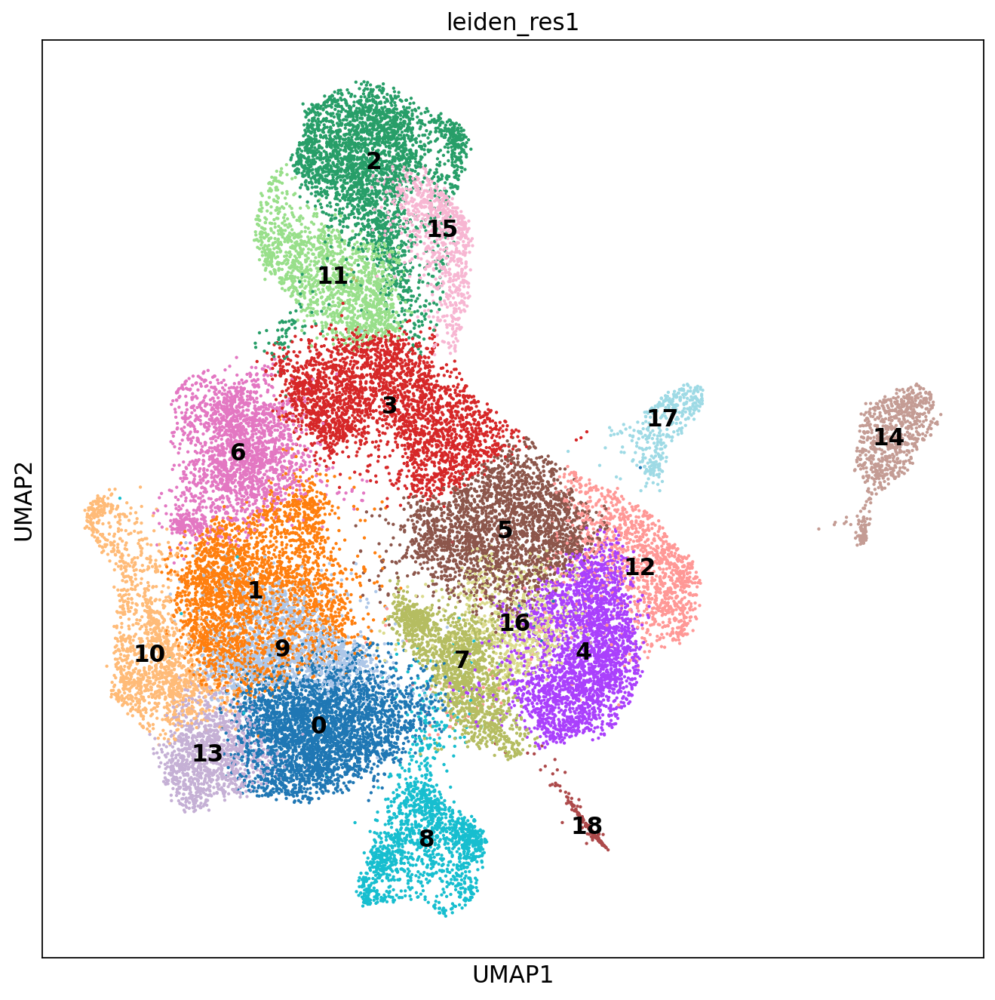

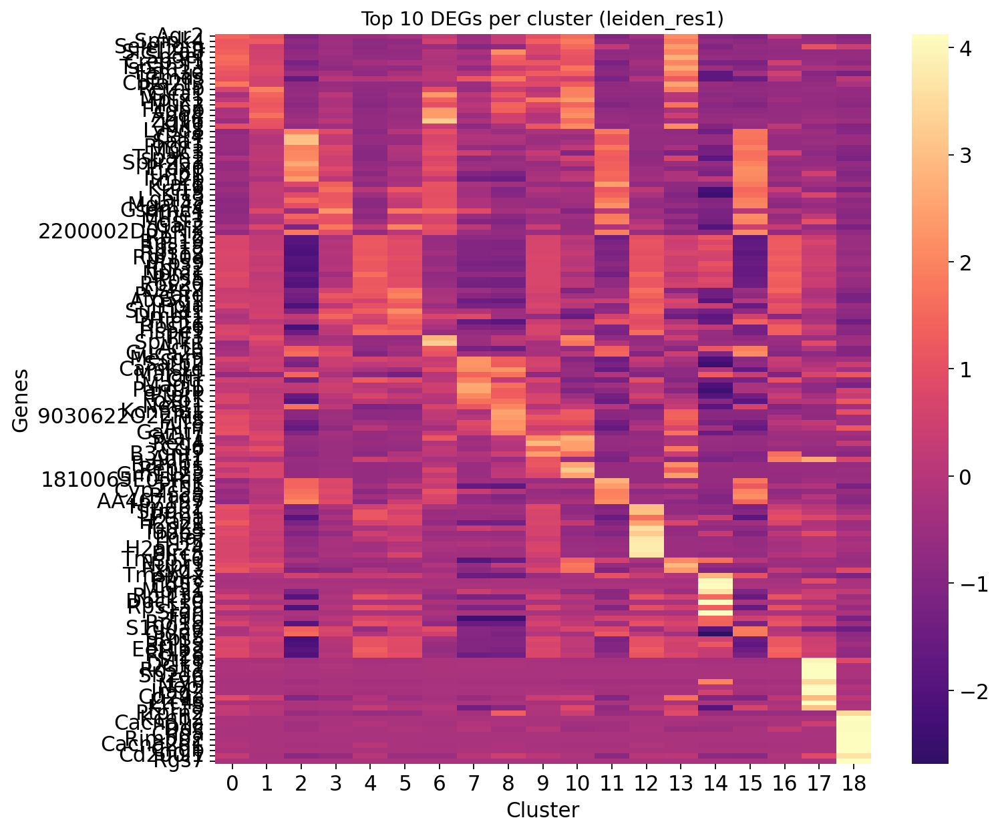

0 - Agr2, Spink4, Selenom, Slc12a8, Spdef, Creb3l1, Tspan13, Fam3d, Gmds, Cbfa2t3
1 - Retnlb, Spink4, Clca1, Mptx1, Agr2, Muc2, Fcgbp, Ang4, Zg16, Klk1
2 - Lypd8, Car4, Saa1, Phgr1, Muc3, Tspan1, Sprr2a3, Prdx6, Crip1, Itm2b
3 - Car1, Krt19, Krt8, Lgals3, Mgat4c, Gsdmc4, Ethe1, Mgst3, Car2, 2200002D01Rik
4 - Rpl12, Rps19, Rps18, Rps12, Rpl10a, Rps9, Rpl32, Npm1, Rps5, Rps20
5 - Csrp2, Pycard, Atp5g1, Ppia, Car2, Sult1a1, Dmbt1, Hint1, Rps26, Hspe1
6 - Zg16, Clca1, Tff3, Fcgbp, Ang4, Spink1, Mptx1, Car1, Actb, Guca2a
7 - Mecom, Satb2, Camk1d, Malat1, Gmds, Cftr, Magi1, Pard3b, Ptprk, Foxp1
8 - Gmds, Malat1, Muc2, Camk1d, Neat1, Kcnma1, 9030622O22Rik, Fut8, Airn, Galnt7
9 - Sval1, Reg4, Mptx1, Spink4, Ccl6, B3gnt7, Klk1, Fam3d, Agr2, Adh1
10 - Klk1, Ccl6, Spink4, Mptx1, Ramp1, Sval1, Agr2, Muc2, Rep15, Gm1123
11 - 1810065E05Rik, Car1, Fth1, Mgat4c, 2200002D01Rik, Cyp2c55, Lypd8, Lgals3, Plac8, AA467197
12 - Hmgb2, Stmn1, Ptma, H2az1, Top2a, Tubb5, Pclaf, H1f5, H2ac24, Birc5
13 - Agr2, Kl

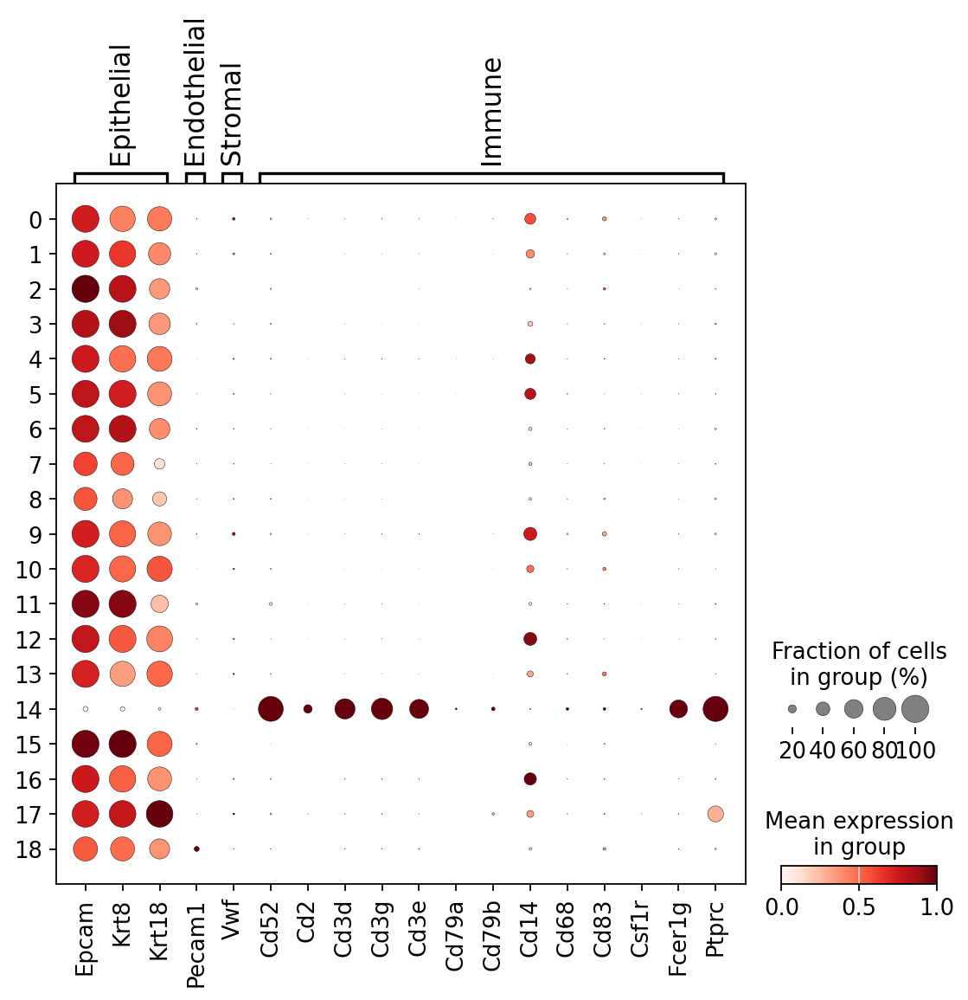

In [ ]:
# Define the working directory containing the integrated and clustered AnnData file
dir = Path("/media/tahila/DADOS/HD/2509-scRNA-seq_seq/03.analises_cellbender_fpr0.005/0.3.6.Sexta_rodada_QC")

# Select the Leiden resolution to be used for annotation
res = 1

# === STEP 1: Initial cluster inspection and DEG-based annotation ===
# This step loads the integrated AnnData object, plots the UMAP colored by clusters,
# and identifies the top differentially expressed genes (DEGs) per cluster.
adata, cluster_genes = Anota1(
    f"{dir}/04.8.Integrated-clustered_output_35.h5ad",
    res=res
)

# Print the top marker genes for each cluster
# This helps with manual inspection and biological interpretation
for cl, genes in cluster_genes.items():
    print(f'{cl} - {", ".join(genes)}')

# === STEP 2: Marker-based annotation using curated marker sets ===
# This step evaluates predefined marker genes (broad epithelial markers, in this case)
# against the clusters using dotplots and signature-based scoring methods.
adata, marker_genes_in_data_nirello = Anot2_with_Markers(
    adata,
    marker_genes_broad,
    res=res,
    umap=False,   # do not plot UMAPs for scores at this stage
    dotplot=True # generate dotplots for marker expression across clusters
)


Here, in the dotplot, we can identify cluster 14 as a non-IEC cluster. Therefore, we went back to the `04.Integration-Clustering` notebook to exclude this cluster and rerun the integration and clustering steps. After that, we performed the annotation again, as shown below.

# ANOTATION 2 (Non-epithelial clusters excluded)

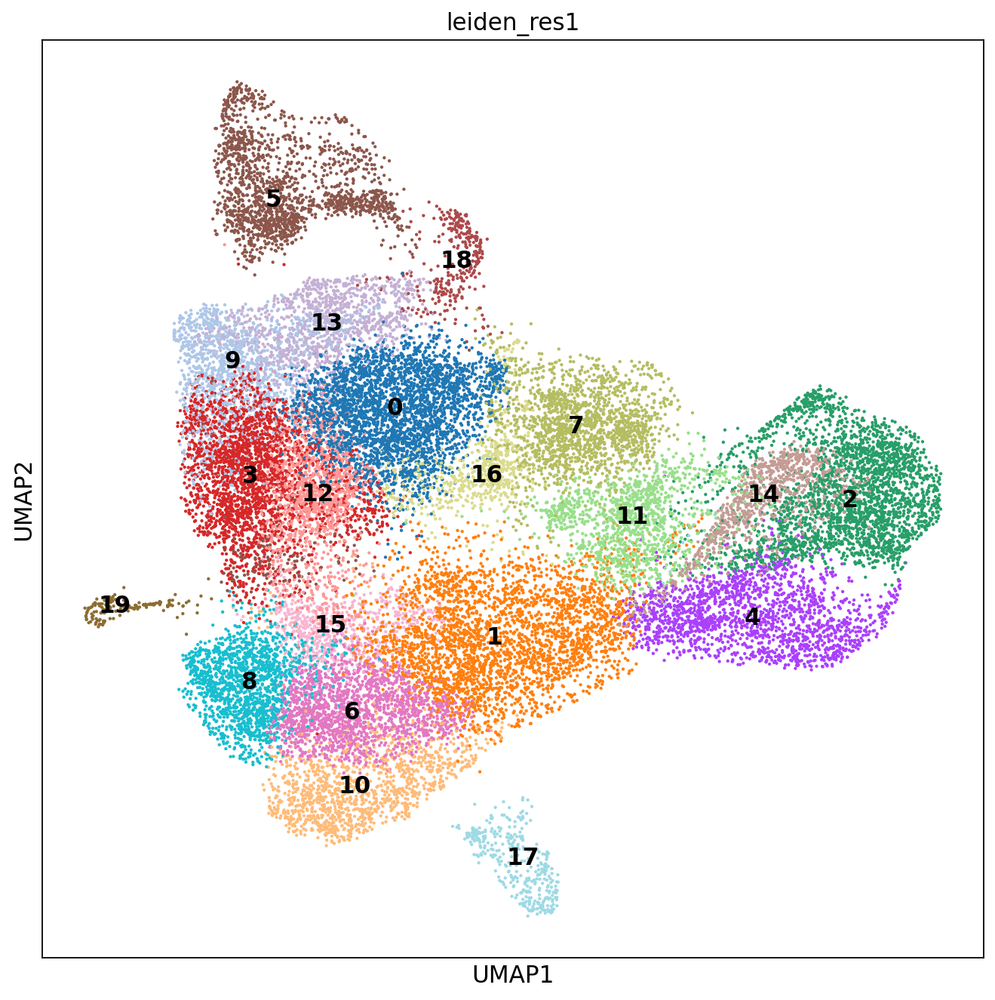

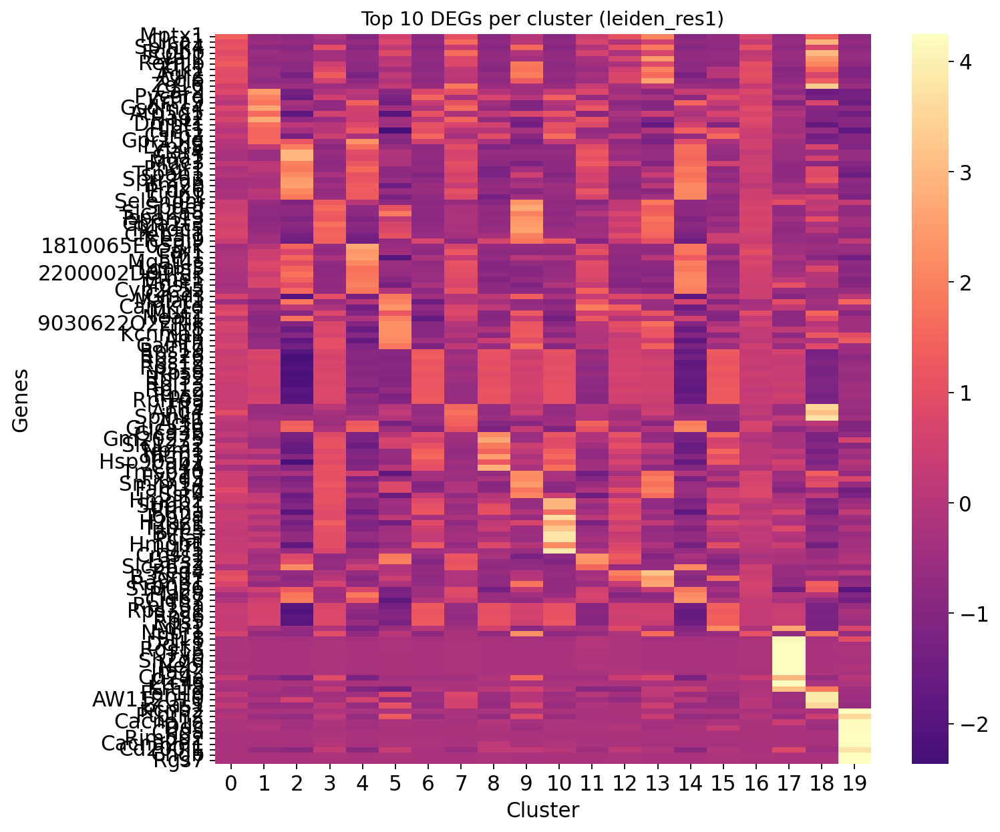

0 - Mptx1, Clca1, Spink4, Fcgbp, Sval1, Retnlb, Klk1, Agr2, Ccl6, Zg16
1 - Car2, Pycard, Krt19, Gsdmc4, Atp5g1, Hao2, Dmbt1, Hint1, Csrp2, Gpr15lg
2 - Lypd8, Car4, Saa1, Muc3, Phgr1, Tspan1, Sprr2a3, Itm2b, Prdx6, Crip1
3 - Agr2, Selenom, Spdef, Slc12a8, Tspan13, Spink4, Cbfa2t3, Txndc5, Creb3l1, Tceal9
4 - 1810065E05Rik, Car1, Fth1, Mgat4c, Lgals3, 2200002D01Rik, Ethe1, Mgst3, Cyp2c55, Lypd8
5 - Gmds, Malat1, Camk1d, Muc2, Neat1, 9030622O22Rik, Fut8, Kcnma1, Airn, Galnt7
6 - Rps19, Rps26, Rps12, Rps18, Rps8, Rpl32, Rpl13, Rpl12, Rps9, Rpl10a
7 - Zg16, Clca1, Fcgbp, Tff3, Ang4, Spink1, Car1, Actb, Guca2a, Mptx1
8 - Clca3b, Gm20275, Rpl12, Slc12a2, Npm1, Ifitm3, Rps18, Hsp90ab1, Rps19, Cd44
9 - Agr2, Selenom, Tmsb10, Klk1, Spink4, Tspan13, Fxyd3, Smim14, Fam3d, Ssr4
10 - Hmgb2, Stmn1, Ptma, Top2a, H2az1, Tubb5, Birc5, Pclaf, Hmgb1, H1f5
11 - Cmss1, Cyp2c55, Lars2, Actb, Muc3, Guca2a, Camk1d, Slc26a3, Car1, Lypd8
12 - Mptx1, Spink4, Reg4, Fam3d, Agr2, Clca3b, B3gnt7, Camk1d, Gmds, Sval1


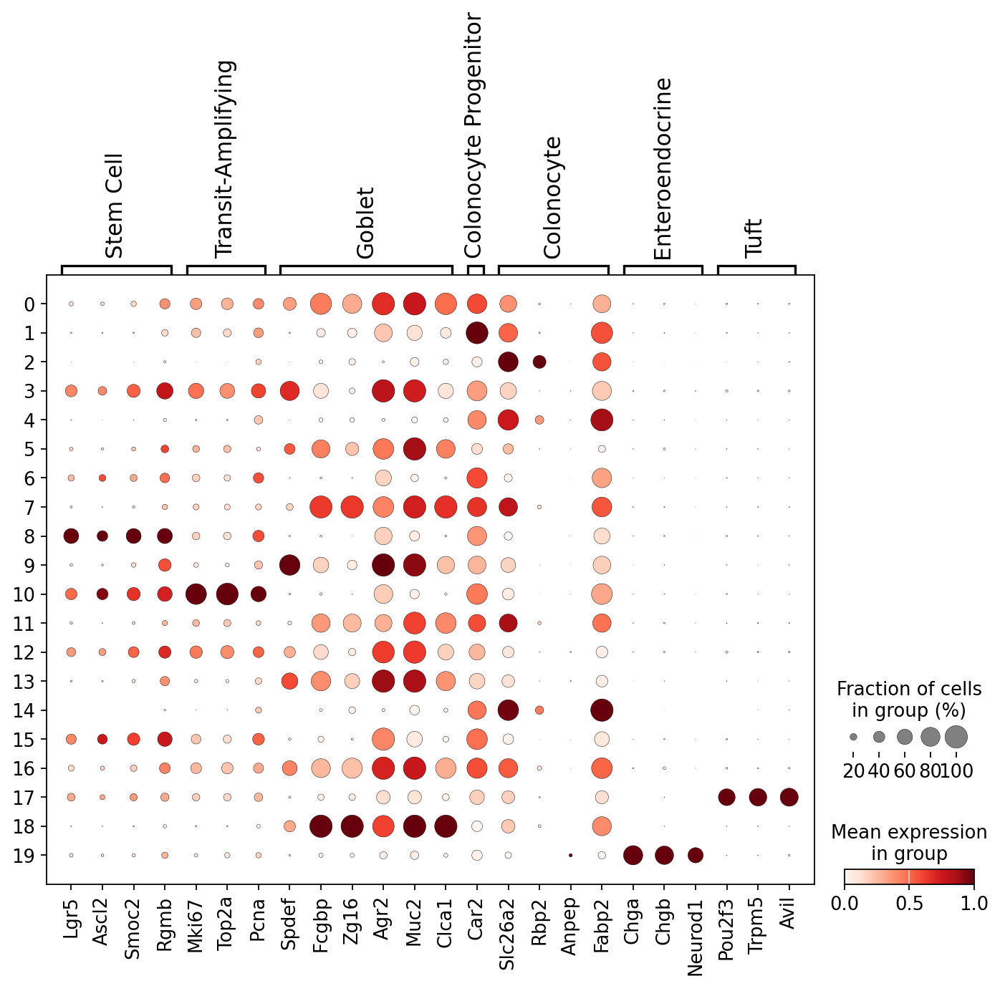

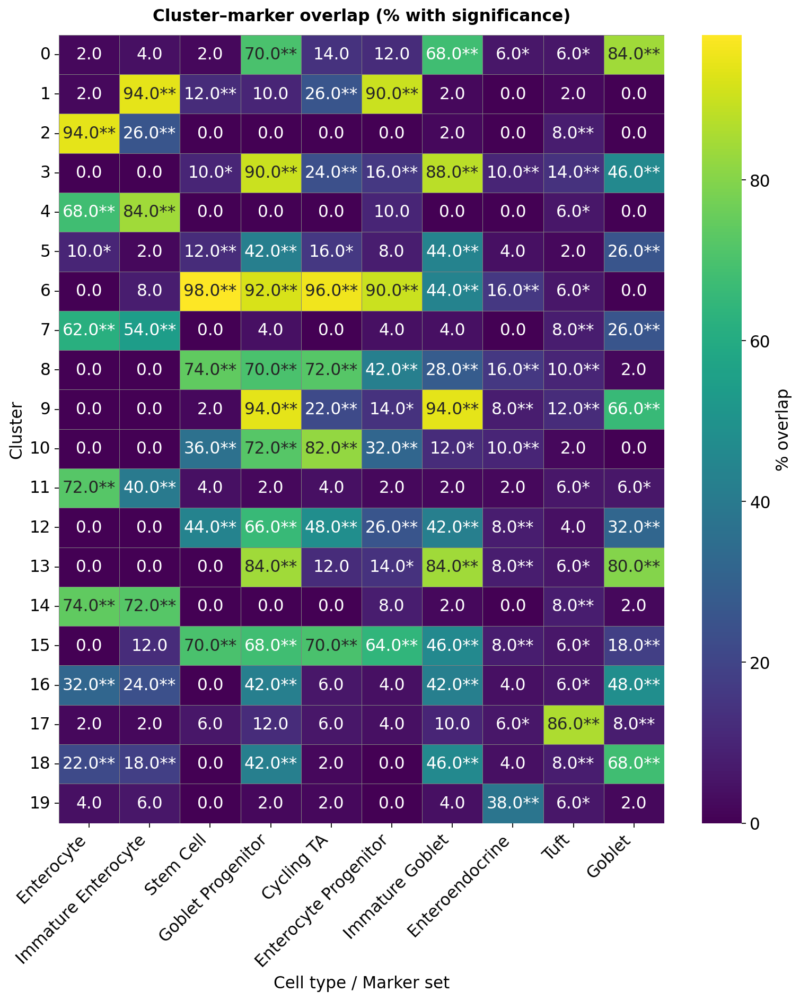

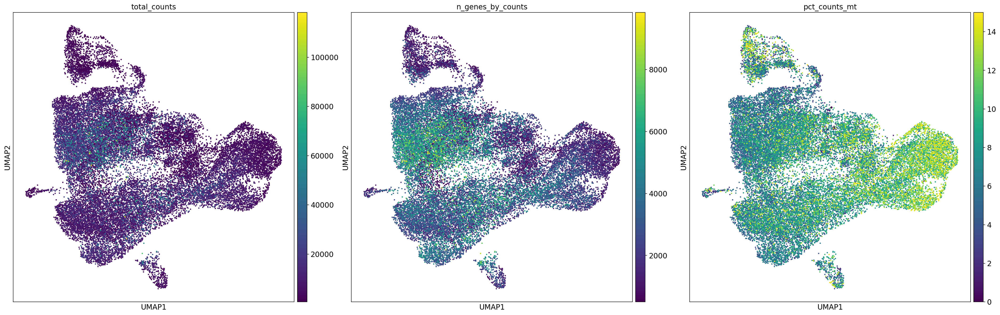

2025-12-19 10:43:31 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-12-19 10:43:31 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-12-19 10:43:31 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-12-19 10:43:31 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-12-19 10:43:31 | [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If 

,Enterocyte,Immature Enterocyte,Stem Cell,Goblet Progenitor,Cycling TA,Enterocyte Progenitor,Immature Goblet,Enteroendocrine,Tuft,Goblet
0,2.0,4.0,2.0,70.0,14.0,12.0,68.0,6.0,6.0,84.0
1,2.0,94.0,12.0,10.0,26.0,90.0,2.0,0.0,2.0,0.0
2,94.0,26.0,0.0,0.0,0.0,0.0,2.0,0.0,8.0,0.0
3,0.0,0.0,10.0,90.0,24.0,16.0,88.0,10.0,14.0,46.0
4,68.0,84.0,0.0,0.0,0.0,10.0,0.0,0.0,6.0,0.0
5,10.0,2.0,12.0,42.0,16.0,8.0,44.0,4.0,2.0,26.0
6,0.0,8.0,98.0,92.0,96.0,90.0,44.0,16.0,6.0,0.0
7,62.0,54.0,0.0,4.0,0.0,4.0,4.0,0.0,8.0,26.0
8,0.0,0.0,74.0,70.0,72.0,42.0,28.0,16.0,10.0,2.0
9,0.0,0.0,2.0,94.0,22.0,14.0,94.0,8.0,12.0,66.0


In [ ]:
# Define the working directory containing the integrated, QC-filtered, and immune-excluded dataset
dir = Path("/media/tahila/DADOS/HD/2509-scRNA-seq_seq/03.analises_cellbender_fpr0.005/0.3.6.Sexta_rodada_QC")

# Choose the Leiden clustering resolution to be used for annotation
res = 1


# ======================================================
# STEP 1: Initial annotation after immune-cell exclusion
# ======================================================
# Load the integrated AnnData object (after immune cluster removal),
# visualize clusters on UMAP, and extract top DEGs per cluster.
adata, cluster_genes = Anota1(
    f"{dir}/04.8.Integrated-clustered_output_35_exclImune",
    res=res
)

# Print top marker genes for each cluster
# Useful for manual inspection and biological interpretation
for cl, genes in cluster_genes.items():
    print(f'{cl} - {", ".join(genes)}')


# ======================================================
# STEP 2: Marker-based annotation with curated gene sets
# ======================================================
# Apply epithelial marker genes (custom curated set)
# Generates dotplots and computes module/AUCell scores if enabled
adata, marker_genes_in_data_ep = Anot2_with_Markers(
    adata,
    marker_genes_epithelial,
    res=res,
    umap=False,
    dotplot=True
)

# Apply epithelial marker genes from Nirello et al. (2025)
# Dotplot is skipped here to reduce redundancy
adata, marker_genes_in_data_nirello = Anot2_with_Markers(
    adata,
    marker_genes_ep_nirello,
    res=res,
    umap=False,
    dotplot=False
)


# ======================================================
# STEP 3: Expanded DEG analysis (Top 50 genes per cluster)
# ======================================================
# Recompute DEGs with stricter filtering:
# - Removes mitochondrial, ribosomal, and hemoglobin genes
cluster_genes, _ = RankGenesByCluster(
    adata,
    groupby=f"leiden_res{res}",
    filtra_mt_rb_hb=True,
    n_genes=50
)


# ======================================================
# STEP 4: Intersection with literature-based markers
# ======================================================
# Compute overlap between cluster DEGs and Nirello marker sets:
# - pct_tab: percentage of cluster genes overlapping each marker set
# - pval_tab: Fisher exact test p-values for enrichment
pct_tab  = InterDics(cluster_genes, marker_genes_ep_nirello, mode='pct')
pval_tab = InterDics(cluster_genes, marker_genes_ep_nirello, mode='pval')

# Plot a heatmap highlighting both overlap percentage and statistical significance
PlotSignificantHeatmap(
    pct_table=pct_tab,
    pval_table=pval_tab,
    cmap='viridis',
    figsize=(10, 12)
)


# ======================================================
# STEP 5: Quality control visualization after annotation
# ======================================================
# Visualize basic QC metrics on the UMAP
sc.pl.umap(
    adata,
    color=["total_counts", "n_genes_by_counts", "pct_counts_mt"],
    size=25
)

# Plot violin plots of QC metrics grouped by cluster
PlotMetricsViolinGrid(
    adata,
    metrics=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    x_obs=f"leiden_res{res}",
    ncols=1,
    figsize=(20, 20),
    rotation=45,
    jitter=0.3,      # more spread of individual points
    point_size=0.4,  # smaller points for dense plots
    spacing=0.7      # more space between panels
)


# ======================================================
# STEP 6: Final intersection table (percentage overlap)
# ======================================================
# Generate a clean table of percentage overlaps
# between cluster DEGs and Nirello epithelial markers
inter_dics = InterDics(
    dic_index=cluster_genes,
    dic_col=marker_genes_ep_nirello,
    mode="pct"
)

inter_dics


## Anotação per se

... storing 'celltype_annotation_epithelial' as categorical


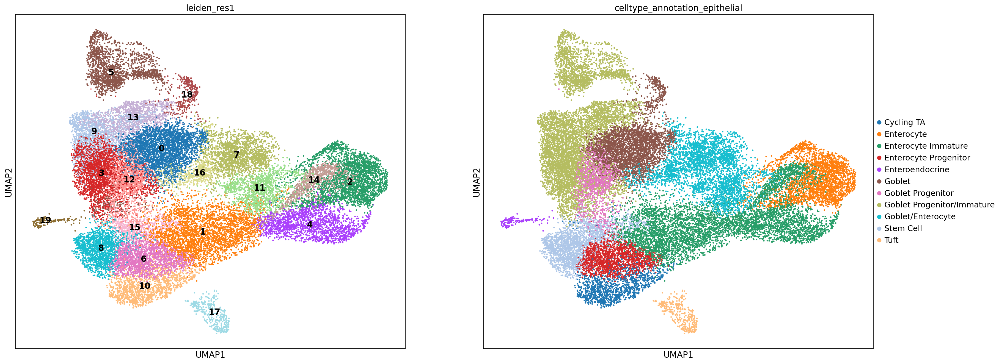

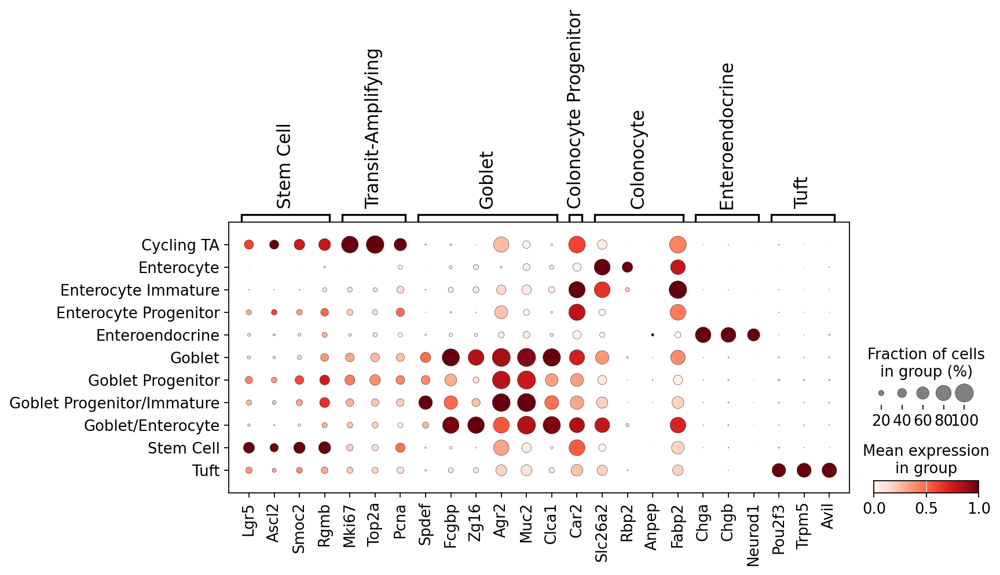

In [ ]:
# Dictionary mapping Leiden cluster IDs to manually curated epithelial cell-type labels
annotation = {
    "0": "Goblet",
    "1": "Enterocyte Immature",
    "2": "Enterocyte",
    "3": "Goblet Progenitor/Immature",
    "4": "Enterocyte Immature",
    "5": "Goblet Progenitor/Immature",
    "6": "Enterocyte Progenitor",
    "7": "Goblet/Enterocyte",
    "8": "Stem Cell",
    "9": "Goblet Progenitor/Immature",
    "10": "Cycling TA",
    "11": "Goblet/Enterocyte",
    "12": "Goblet Progenitor",
    "13": "Goblet Progenitor/Immature",
    "14": "Enterocyte Immature",
    "15": "Stem Cell",
    "16": "Goblet/Enterocyte",
    "17": "Tuft",
    "18": "Goblet",
    "19": "Enteroendocrine",
}

# Name of the new observation column that will store epithelial cell-type annotations
obs_col_name = f"celltype_annotation_epithelial"

# Map Leiden cluster labels to epithelial cell-type annotations
adata.obs[obs_col_name] = adata.obs[f"leiden_res{res}"].map(annotation)

# 🔹 Remove existing color definitions for this annotation (if present)
# This avoids conflicts or errors when re-plotting
if obs_col_name + "_colors" in adata.uns:
    del adata.uns[obs_col_name + "_colors"]

# Set default figure parameters
sc.set_figure_params(figsize=(10, 10))

# ======================================================
# Plot UMAPs: clusters vs. epithelial cell-type annotation
# ======================================================
fig, axes = plt.subplots(1, 2, figsize=(25, 10))

# UMAP colored by Leiden clusters (with labels on the embedding)
sc.pl.umap(
    adata,
    color=f'leiden_res{res}',
    ax=axes[0],
    show=False,
    size=25,
    legend_loc='on data'
)

# UMAP colored by manual epithelial cell-type annotation
sc.pl.umap(
    adata,
    color=obs_col_name,
    ax=axes[1],
    size=25,
    show=False
)

# ======================================================
# Dotplot of epithelial marker genes by annotated cell type
# ======================================================
# Visualizes relative expression of curated epithelial markers
# across the manually annotated cell types
sc.pl.dotplot(
    adata,
    groupby=obs_col_name,
    var_names=marker_genes_in_data_ep,
    standard_scale="var"  # normalize each gene to the [0, 1] range
)

# Adjust spacing between subplots and display the figure
fig.subplots_adjust(wspace=0.01)
plt.show()


# COMPOSITIONAL ANALYSIS

In [ ]:
id_dic = {'87':"87_WT",
          '88':"88_KO",
          '89':"89_WT",
          '90':"90_KO"}

adata.obs['id'] = adata.obs["sample"].map(id_dic)

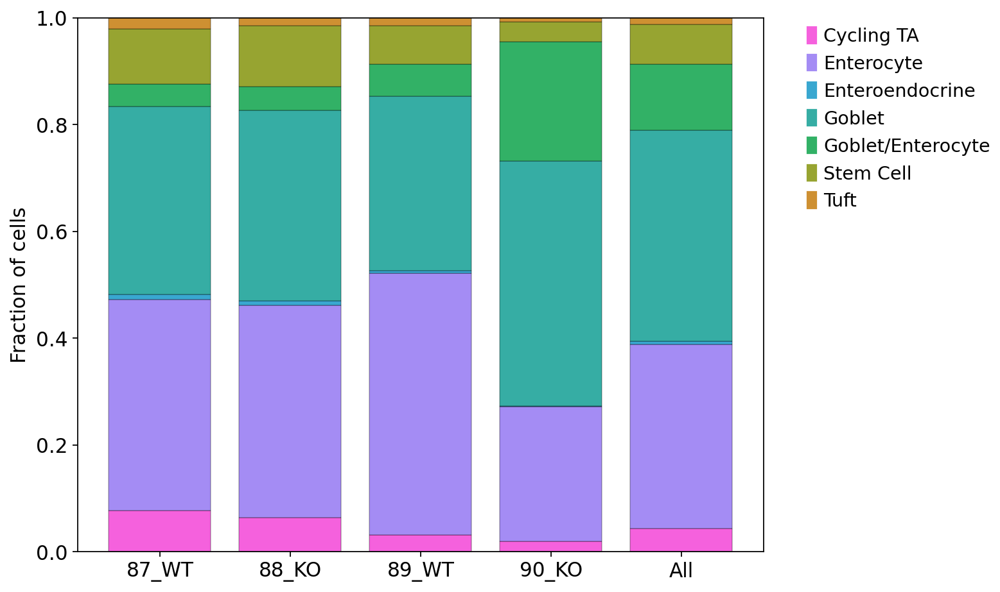

In [ ]:
PlotSampleComposition(adata, 
                                     celltype_col="celltype_annotation_epithelial",
                                     sample_col='id',
                                     figsize=(10, 6),
                                     palette=list(sns.color_palette("husl", 8))[::-1],
                                     bar_width=0.9,
                                     bar_spacing=0.15, 
                                     include_all=True,
                                     x_rotation=0,
                                     x_ticks=None)

In [ ]:
def MapASP(annotation):
    """
    Maps fine-grained epithelial cell-type annotations to broader
    absorptive/secretory/progenitor (ASP) categories.

    Parameters
    ----------
    annotation : dict
        Dictionary mapping cluster IDs (or similar keys) to detailed
        epithelial cell-type labels.

    Returns
    -------
    dict
        Dictionary mapping the same keys to broader ASP categories.
    """

    # Define mapping from detailed epithelial identities
    # to broader functional classes
    map_macro = {
        "Enterocyte": "Absorptive",
        "Goblet": "Secretory",
        "Tuft": "Secretory",
        "Enteroendocrine": "Secretory",
        "Stem Cell": "Progenitor",
        "Cycling TA": "Progenitor",
        "Goblet / Enterocyte": "Absorptive/Secretory",
    }

    # Apply the mapping; any label not found defaults to "Other"
    annotation_mapped = {k: map_macro.get(v, "Other") for k, v in annotation.items()}

    return annotation_mapped


... storing 'celltype_annotation_asp' as categorical


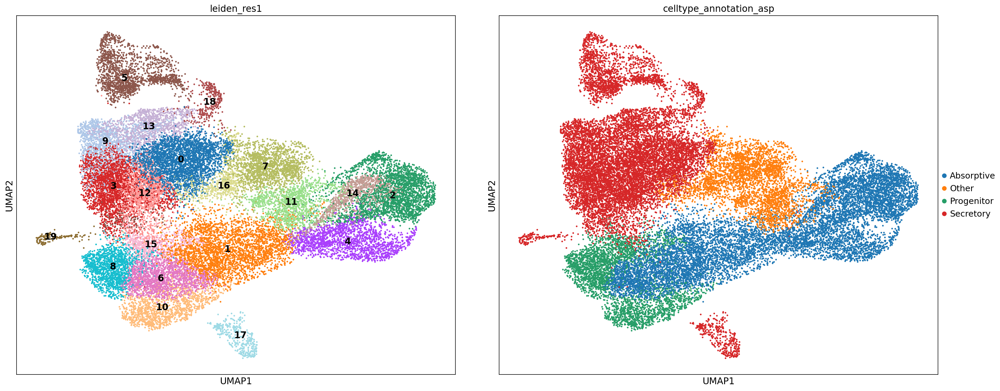

In [ ]:
# Generate ASP-level annotations from the epithelial annotation dictionary
annotation_asp = MapASP(annotation)

# Name of the new observation column for ASP-level annotations
obs_col_name = f"celltype_annotation_asp"

# Map Leiden clusters to ASP-level annotations
adata.obs[obs_col_name] = adata.obs[f"leiden_res{res}"].map(annotation_asp)

# 🔹 Remove existing color definitions for this annotation (if present)
# This avoids conflicts when re-plotting
if obs_col_name + "_colors" in adata.uns:
    del adata.uns[obs_col_name + "_colors"]

# Set default figure parameters
sc.set_figure_params(figsize=(10, 10))

# ======================================================
# Plot UMAPs: clusters vs. ASP-level cell-type annotation
# ======================================================
fig, axes = plt.subplots(1, 2, figsize=(25, 10))

# UMAP colored by Leiden clusters
sc.pl.umap(
    adata,
    color=f'leiden_res{res}',
    ax=axes[0],
    show=False,
    size=25,
    legend_loc='on data'
)

# UMAP colored by ASP-level annotation
sc.pl.umap(
    adata,
    color=obs_col_name,
    ax=axes[1],
    size=25,
    show=False
)

# Adjust spacing between subplots and display the figure
fig.subplots_adjust(wspace=0.1)
plt.show()


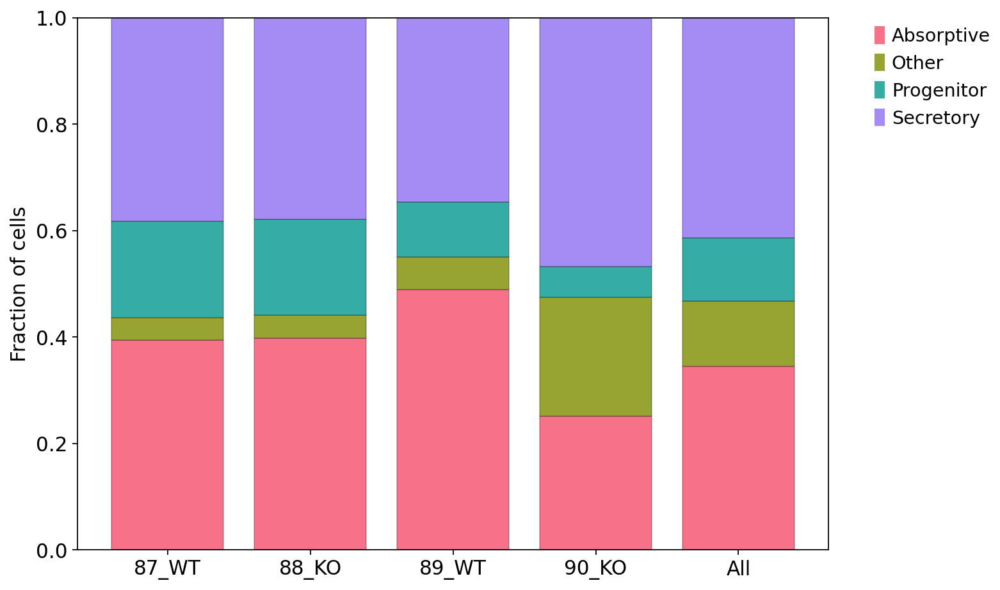

In [ ]:
PlotSampleComposition(adata, 
                                     celltype_col="celltype_annotation_asp",
                                     sample_col='id',
                                     figsize=(10, 6),
                                     palette=list(sns.color_palette("husl", 4)),#[::-1],
                                     bar_width=0.9,
                                     bar_spacing=0.15, 
                                     include_all=True,
                                     x_rotation=0,
                                     x_ticks=None)